In [121]:
# Dependencies and Setup
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
import time
from scipy.stats import linregress
import scipy.stats as st
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
from datetime import timedelta
from datetime import time
from matplotlib.ticker import StrMethodFormatter
import numpy as np

# Import the OpenWeatherMap API key
from api_keys_weather import api_key

#UFO data files
ufo_data_path = "scrubbed_4_weather.csv"

#read the file
ufo_data = pd.read_csv(ufo_data_path)

# Display the data table for preview
ufo_data

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444
80328,9/9/2013 22:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500
80329,9/9/2013 22:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444
80330,9/9/2013 22:20,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556


## Use the weather api to retrieve weather data based on the ufo_data

In [124]:
#the 'longitude' column shows "keyerror", check the name 
ufo_data.columns

Index(['datetime', 'city', 'state', 'country', 'shape', 'duration (seconds)',
       'duration (hours/min)', 'comments', 'date posted', 'latitude',
       'longitude '],
      dtype='object')

In [3]:
api_key = "e49190c9dc8b0da7ffc073fae4e34946"


In [4]:
#Longitude data on line 43782 contains erroneous info

# ufo_data_ex = ufo_data.loc[ufo_data["latitude"] != "33q.200088"]
# ufo_data_ex

# #create a dataframe of city, state, country, latitude, longitude

# ufo_location = ufo_data.drop(columns=['shape', 'duration (seconds)', 'duration (hours/min)', 'comments', 'date posted'])
# ufo_location

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611
...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444
80328,9/9/2013 22:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500
80329,9/9/2013 22:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444
80330,9/9/2013 22:20,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556


In [125]:
#change datatime format for url request
#change the pandas datetime format
ufo_time = pd.DataFrame({
    'Date': ufo_data["datetime"]
})
ufo_time['datetime_zero'] = ufo_time['Date'].str.replace('24:00', '0:00')
ufo_time['datetime_er'] = pd.to_datetime(ufo_time['datetime_zero'], format='%m/%d/%Y %H:%M')
selrow = ufo_time['Date'].str.contains('24:00')
ufo_datetime = ufo_time['datetime_obj'] = ufo_time['datetime_er'] + selrow * timedelta(days=1)

# remove time from Date and store it in a new column
ufo_data["Date"] = ufo_datetime.dt.date

# convert time to hourly
ufo_data["Time"]= (ufo_datetime.dt.hour)*100

#info of the ufo_data
# ufo_data.info()

#preview of the ufo_data with new columns of 'Date' and 'Time'
ufo_data

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,Date,Time
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.8830556,-97.941111,1949-10-10,2000
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.38421,-98.581082,1949-10-10,2100
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.2,-2.916667,1955-10-10,1700
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.9783333,-96.645833,1956-10-10,2100
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.4180556,-157.803611,1960-10-10,2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80327,9/9/2013 21:15,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013-09-09,2100
80328,9/9/2013 22:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013-09-09,2200
80329,9/9/2013 22:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013-09-09,2200
80330,9/9/2013 22:20,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013-09-09,2200


In [129]:
#Longitude data on line 43782 contains erroneous info
ufo_data = ufo_data.loc[ufo_data["latitude"] != "33q.200088",:]

In [130]:
#converting dtypes using astype (Will helped here)
ufo_data['Date'] = ufo_data.Date.astype('str')

In [131]:
#check the dtype (Will helped here)
ufo_data['Date']

0        1949-10-10
1        1949-10-10
2        1955-10-10
3        1956-10-10
4        1960-10-10
            ...    
80327    2013-09-09
80328    2013-09-09
80329    2013-09-09
80330    2013-09-09
80331    2013-09-09
Name: Date, Length: 80331, dtype: object

In [132]:
#converting dtypes using astype to make sure lat & lon match the url request parameters (Will helped here)
ufo_data['longitude '] = ufo_data['longitude '].astype(float)
ufo_data['latitude'] = ufo_data['latitude'].astype(float)


In [133]:
#converting the column 'Date' to datetime format and add a new column 'date' (Will helped here)
ufo_data['date'] = pd.to_datetime(ufo_data.Date)

In [134]:
#creating the new column 'year' for next step (Will helped here)
ufo_data['year'] = ufo_data.date.dt.year

In [455]:
# weatherstack.com only have the historical data from 2009, narrow down the time range for url request (Will helped here)
test = ufo_data[ufo_data['year']>2008]

In [457]:
t = test[['latitude','longitude ','Date']]


In [458]:
t

,latitude,longitude,Date
203,38.869722,-106.987222,2009-10-10
204,36.153889,-95.992500,2009-10-10
205,34.111111,-109.290833,2009-10-10
206,36.728056,-76.583889,2009-10-10
207,33.835278,-117.913611,2009-10-10
...,...,...,...
80327,36.165833,-86.784444,2013-09-09
80328,43.613611,-116.202500,2013-09-09
80329,38.297222,-122.284444,2013-09-09
80330,38.901111,-77.265556,2013-09-09


In [460]:
fix = pd.concat([test,df],axis=1)

In [461]:
fix

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,...,date,date_epoch,astro,mintemp,maxtemp,avgtemp,totalsnow,sunhour,uv_index,hourly
203,10/10/2009 12:00,crested butte,co,us,egg,60,1min,metallic egg shaped craft above crested butte&...,12/12/2009,38.869722,...,2012-10-01,1.349050e+09,"{'sunrise': '07:23 AM', 'sunset': '07:16 PM', ...",25.0,30.0,27.0,0.0,11.6,6.0,"[{'time': 0, 'temperature': 30, 'wind_speed': ..."
204,10/10/2009 12:42,tulsa,ok,us,unknown,6,6 seconds,In&#39t see nothing in the park,12/12/2009,36.153889,...,2012-10-01,1.349050e+09,"{'sunrise': '06:48 AM', 'sunset': '06:37 PM', ...",23.0,34.0,28.0,0.0,11.6,7.0,"[{'time': 0, 'temperature': 34, 'wind_speed': ..."
205,10/10/2009 16:24,eagar,az,us,unknown,180,2-3 minutes,Second sighting was only 150 feet away. Obser...,12/12/2011,34.111111,...,2012-10-01,1.349050e+09,"{'sunrise': '07:16 AM', 'sunset': '07:02 PM', ...",11.0,14.0,13.0,0.0,5.9,3.0,"[{'time': 0, 'temperature': 14, 'wind_speed': ..."
206,10/10/2009 19:30,suffolk,va,us,unknown,900,15 minutes,It looked sort of lime green. It appeared to ...,12/12/2009,36.728056,...,2012-10-01,1.349050e+09,"{'sunrise': '07:15 AM', 'sunset': '06:57 PM', ...",11.0,18.0,14.0,0.0,11.4,4.0,"[{'time': 0, 'temperature': 18, 'wind_speed': ..."
207,10/10/2009 20:30,anaheim,ca,us,light,300,5 mins,UFO over Disneyland.,12/12/2009,33.835278,...,2012-10-01,1.349050e+09,"{'sunrise': '06:52 AM', 'sunset': '06:40 PM', ...",19.0,28.0,23.0,0.0,11.6,6.0,"[{'time': 0, 'temperature': 28, 'wind_speed': ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30564,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2013-09-09,1.378685e+09,"{'sunrise': '06:25 AM', 'sunset': '07:03 PM', ...",21.0,34.0,26.0,0.0,11.6,6.0,"[{'time': 0, 'temperature': 34, 'wind_speed': ..."
30565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2013-09-09,1.378685e+09,"{'sunrise': '07:18 AM', 'sunset': '08:05 PM', ...",13.0,27.0,20.0,0.0,11.6,5.0,"[{'time': 0, 'temperature': 27, 'wind_speed': ..."
30566,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2013-09-09,1.378685e+09,"{'sunrise': '06:46 AM', 'sunset': '07:26 PM', ...",17.0,35.0,24.0,0.0,11.6,6.0,"[{'time': 0, 'temperature': 35, 'wind_speed': ..."
30567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2013-09-09,1.378685e+09,"{'sunrise': '06:45 AM', 'sunset': '07:27 PM', ...",16.0,26.0,21.0,0.0,10.3,5.0,"[{'time': 0, 'temperature': 26, 'wind_speed': ..."


In [13]:
#create a new list for weather info
weather = []
urls = []

#request info via url
for index, row in test.iterrows():
    lat = round(row["latitude"],4)
    lon = round(row["longitude "],4)
    date = row["Date"]
    url = "https://api.weatherstack.com/historical"
    
#after trying the http version and failed many times, change to python version to make the request (Will helped here)
    params = {
              'access_key': api_key,
              'query': f"{lat},{lon}",
              'historical_date':date,
              'hourly':1,
              'interval':24
                }
#in case there's any interruption when requesting the 80,000+ rows info (Will helped here)
    try:
        api_result = requests.get("https://api.weatherstack.com/historical", params)
        api_response = api_result.json()
        weather.append(api_response['historical'][str(date)])
    except:
        pass
    
    # query_url = f"{url}?access_key={api_key}&query={lat},{lon}&historical_date={date}&hourly=1&interval=24"
    # query_url = f"{url}?access_key={api_key}&query=New York&historical_date={date}&hourly=1&interval=24"

    # urls.append(query_url)
    # ufo_test = requests.get(query_url).json()
    # try: 
    #     df = pd.DataFrame(ufo_test['historical'][date]['hourly'])        
    #     # df['match_index'] = index
    #     weather = pd.concat([weathhttps://api.weatherstack.com/historical??access_key=e49190c9dc8b0da7ffc073fae4e34946&query=36.5950000,-82.1888889&historical_date=1961-10-10&hourly=1&interval=24er,df])
    # except:
    #     pass    

In [15]:
#create a dataframe of the weather info
df = pd.DataFrame(weather)

In [442]:
df

,date,date_epoch,astro,mintemp,maxtemp,avgtemp,totalsnow,sunhour,uv_index,hourly
0,2009-10-10,1255132800,"{'sunrise': '07:13 AM', 'sunset': '06:36 PM', ...",-4,7,1,0.0,11.2,2,"[{'time': 0, 'temperature': 7, 'wind_speed': 1..."
1,2009-10-10,1255132800,"{'sunrise': '07:27 AM', 'sunset': '06:54 PM', ...",5,14,9,0.0,11.3,3,"[{'time': 0, 'temperature': 14, 'wind_speed': ..."
2,2009-10-10,1255132800,"{'sunrise': '06:18 AM', 'sunset': '05:49 PM', ...",2,19,10,0.0,7.2,3,"[{'time': 0, 'temperature': 19, 'wind_speed': ..."
3,2009-10-10,1255132800,"{'sunrise': '07:10 AM', 'sunset': '06:36 PM', ...",16,25,22,0.0,8.6,5,"[{'time': 0, 'temperature': 25, 'wind_speed': ..."
4,2009-10-10,1255132800,"{'sunrise': '06:53 AM', 'sunset': '06:23 PM', ...",14,23,17,0.0,11.6,5,"[{'time': 0, 'temperature': 23, 'wind_speed': ..."
...,...,...,...,...,...,...,...,...,...,...
30564,2013-09-09,1378684800,"{'sunrise': '06:25 AM', 'sunset': '07:03 PM', ...",21,34,26,0.0,11.6,6,"[{'time': 0, 'temperature': 34, 'wind_speed': ..."
30565,2013-09-09,1378684800,"{'sunrise': '07:18 AM', 'sunset': '08:05 PM', ...",13,27,20,0.0,11.6,5,"[{'time': 0, 'temperature': 27, 'wind_speed': ..."
30566,2013-09-09,1378684800,"{'sunrise': '06:46 AM', 'sunset': '07:26 PM', ...",17,35,24,0.0,11.6,6,"[{'time': 0, 'temperature': 35, 'wind_speed': ..."
30567,2013-09-09,1378684800,"{'sunrise': '06:45 AM', 'sunset': '07:27 PM', ...",16,26,21,0.0,10.3,5,"[{'time': 0, 'temperature': 26, 'wind_speed': ..."


In [123]:
# test
# https://api.weatherstack.com/historical?access_key=e49190c9dc8b0da7ffc073fae4e34946&query=35.6527778,-97.4777778&historical_date=2000-09-09&hourly=1&interval=24

{'success': False,
 'error': {'code': 615,
  'type': 'request_failed',
  'info': 'Your API request failed. Please try again or contact support.'}}

In [ ]:
# test
# https://api.weatherstack.com/historical?access_key={api_key}&query=35.6527778,-97.4777778&historical_date=2013-09-09&hourly=1&interval=24

In [74]:
# test
# query_url = f"{url}?access_key={api_key}&query={lat},{lon}&historical_date={date}&hourly=1&interval=24"
# query_url

'https://api.weatherstack.com/historical?access_key=5c808dc84c3b36d961b1012dab43eb76&query=21.4180556,-157.8036111&historical_date=1960-10-10&hourly=1&interval=24'

In [ ]:
# test
# https://api.weatherstack.com/historical?access_key=5c808dc84c3b36d961b1012dab43eb76&query=35.6527778,-97.4777778&historical_date=2013-09-09&hourly=1&interval=24

In [ ]:
# test
# ufo_test = requests.get(query_url).json()

In [18]:
# test
# date = '2013-09-09'
# frame = pd.DataFrame(ufo_test['historical'][date]['hourly'])
# frame[frame['time'] == time]

,time,temperature,wind_speed,wind_degree,wind_dir,weather_code,weather_icons,weather_descriptions,precip,humidity,...,chanceofremdry,chanceofwindy,chanceofovercast,chanceofsunshine,chanceoffrost,chanceofhightemp,chanceoffog,chanceofsnow,chanceofthunder,uv_index
0,0,27,17,186,S,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,52,...,0,0,0,0,0,0,0,0,0,1
1,100,26,16,187,S,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,53,...,0,0,0,0,0,0,0,0,0,1
2,200,25,15,188,S,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,55,...,0,0,0,0,0,0,0,0,0,1
3,300,24,14,189,S,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,56,...,0,0,0,0,0,0,0,0,0,1
4,400,23,13,200,SSW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,58,...,0,0,0,0,0,0,0,0,0,1
5,500,23,13,211,SSW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Clear],0,60,...,0,0,0,0,0,0,0,0,0,1
6,600,23,12,221,SW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Sunny],0,62,...,0,0,0,0,0,0,0,0,0,6
7,700,25,13,216,SW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Sunny],0,59,...,0,0,0,0,0,0,0,0,0,6
8,800,27,13,211,SSW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Sunny],0,56,...,0,0,0,0,0,0,0,0,0,7
9,900,29,14,207,SSW,113,[https://cdn.worldweatheronline.com/images/wsy...,[Sunny],0,54,...,0,0,0,0,0,0,0,0,0,7


In [8]:
# test
# #use testing url to create a dataframe
# url = ('https://api.weatherstack.com/historical?access_key=5c808dc84c3b36d961b1012dab43eb76&query=35.6527778,-97.4777778&historical_date=2013-09-09&hourly=1&interval=1')
# df_test = pd.read_json(url)
# df_test

,request,location,current,historical
type,LatLon,NaN,NaN,NaN
query,Lat 35.65 and Lon -97.48,NaN,NaN,NaN
language,en,NaN,NaN,NaN
unit,m,NaN,NaN,NaN
name,NaN,Edmond,NaN,NaN
country,NaN,United States of America,NaN,NaN
region,NaN,Oklahoma,NaN,NaN
lat,NaN,35.653,NaN,NaN
lon,NaN,-97.478,NaN,NaN
timezone_id,NaN,America/Chicago,NaN,NaN


In [9]:
# test
# detail_weateher_test = df_test["historical"].dropna()
# detail_weateher_test

2013-09-09    {'date': '2013-09-09', 'date_epoch': 137868480...
Name: historical, dtype: object

In [13]:
# test
# ufo_weather_data = []

# for index, row in ufo_data.iterrows():
#     lat = row["latitude"]
#     lon = row["longitude "]
#     date = row["Date"]
#     time = row["Time"]
    
#     weather_data = requests.get(query_url)
#     weather_data = weather_data.json()
    
#     ufo_city_name = weather_data["location"]["name"]
#     ufo_country = weather_data["location"]["country"]
#     ufo_region = weather_data["location"]["region"]
#     ufo_lat = weather_data["location"]["lat"]
#     ufo_lng = weather_data["location"]["lon"]
#     ufo_timezone = weather_data["location"]["timezone_id"]
#     ufo_historical = weather_data["historical"]

In [ ]:
# test
# #create a list to collect weather data

# ufo_weather_data = []

# #Set the API base URL

# for index, row in ufo_data.iterrows():
#     lat = row["latitude"]
#     lon = row["longitude "]
#     date = row["Date"]
#     time = row["Time"]

#     url = "https://api.weatherstack.com/historical"
#     query_url = f"{url}?access_key={api_key}&query={lat},{lon}&historical_date={date}&hourly=1&interval=1"
    
     
#     # Run an API request for each of the cities
#     try:
# #         # Parse the JSON and retrieve data
#         weather_data = requests.get(query_url)
#         weather_data = weather_data.json()
        
# #         # Parse out: 
# #         #city name, country, slatitude, longitude, date, time, timezone
# #         #temperature, wind_speed, weather_code, weather_descriptions
# #         #humidity, visibility, pressure, cloudcover, heatindex, dewpoint
#         ufo_city_name = weather_data["location"]["name"]
#         ufo_country = weather_data["location"]["country"]
#         ufo_region = weather_data["location"]["region"]
#         ufo_lat = weather_data["location"]["lat"]
#         ufo_lng = weather_data["location"]["lon"]
#         ufo_timezone = weather_data["location"]["timezone_id"]
#         ufo_historical = weather_data["historical"]

# #         # Append the City information into city_data list
# #"City": ufo_city_name, 
#                           # "Lat": ufo_lat, 
#                           # "Lng": ufo_lng, 
#                           # "Timezone": ufo_timezone,
#                           # "Country": ufo_country,
#                           # "Region": ufo_region,

#         ufo_weather_data.append({
#                           "Historical Data": ufo_historical,
#                           })

# # #     # If an error is experienced, skip the city
#     except:
#         print("info not found. Skipping...")
#         pass
              
# # # # Indicate that Data Loading is complete 
# print("-----------------------------")
# print("Data Retrieval Complete      ")
# print("-----------------------------")

info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...
info not found. Skipping...


In [448]:
test.latitude

203      38.869722
204      36.153889
205      34.111111
206      36.728056
207      33.835278
           ...    
80327    36.165833
80328    43.613611
80329    38.297222
80330    38.901111
80331    35.652778
Name: latitude, Length: 30586, dtype: float64

In [444]:
df.shape

(30569, 10)

In [46]:
# Export the weather_data into a csv

df.to_csv("ufo_weathers_info.csv", index_label="index")


In [155]:
# ufo_data.info() changing the data dtype to merge
ufo_data['date'] = ufo_data['date'].astype('str')

In [228]:
# #clear the df data by sorting the column 'date' 'mintemp' 'maxtemp' 'avgtemp' 'totalsnow' 'sunhour'
ufo_df_clear = df[['date','mintemp','maxtemp','avgtemp','totalsnow','sunhour']]

In [454]:
weather

[{'date': '2009-10-10',
  'date_epoch': 1255132800,
  'astro': {'sunrise': '07:13 AM',
   'sunset': '06:36 PM',
   'moonrise': '11:39 PM',
   'moonset': '02:01 PM',
   'moon_phase': 'Last Quarter',
   'moon_illumination': 51},
  'mintemp': -4,
  'maxtemp': 7,
  'avgtemp': 1,
  'totalsnow': 0,
  'sunhour': 11.2,
  'uv_index': 2,
  'hourly': [{'time': 0,
    'temperature': 7,
    'wind_speed': 12,
    'wind_degree': 220,
    'wind_dir': 'SW',
    'weather_code': 113,
    'weather_icons': ['https://cdn.worldweatheronline.com/images/wsymbols01_png_64/wsymbol_0001_sunny.png'],
    'weather_descriptions': ['Sunny'],
    'precip': 0,
    'humidity': 46,
    'visibility': 10,
    'pressure': 1013,
    'cloudcover': 3,
    'heatindex': 1,
    'dewpoint': -11,
    'windchill': -2,
    'windgust': 32,
    'feelslike': -2,
    'chanceofrain': 0,
    'chanceofremdry': 0,
    'chanceofwindy': 0,
    'chanceofovercast': 0,
    'chanceofsunshine': 0,
    'chanceoffrost': 0,
    'chanceofhightemp': 0,


In [441]:
ufo_df_clear

,date,mintemp,maxtemp,avgtemp,totalsnow,sunhour
0,2009-10-10,-4,7,1,0.0,11.2
1,2009-10-10,5,14,9,0.0,11.3
2,2009-10-10,2,19,10,0.0,7.2
3,2009-10-10,16,25,22,0.0,8.6
4,2009-10-10,14,23,17,0.0,11.6
...,...,...,...,...,...,...
30564,2013-09-09,21,34,26,0.0,11.6
30565,2013-09-09,13,27,20,0.0,11.6
30566,2013-09-09,17,35,24,0.0,11.6
30567,2013-09-09,16,26,21,0.0,10.3


In [427]:
#remove duplicates
ufo_df_clear = ufo_df_clear.drop_duplicates()

In [437]:
# grouped_single = df.groupby('Team').agg({'Age': ['mean', 'min', 'max']})
weather_df = ufo_df_clear.groupby(['date'],as_index=False).agg({'mintemp':'min','maxtemp':'max', 'avgtemp':'mean', 'totalsnow':'sum', 'sunhour':'mean'})

In [440]:
weather_df

,date,mintemp,maxtemp,avgtemp,totalsnow,sunhour
0,2009-01-01,-29,28,4.857143,0.4,7.660000
1,2009-01-02,-48,23,-0.833333,0.6,6.358333
2,2009-01-03,-10,24,4.285714,0.0,8.128571
3,2009-01-04,-22,16,0.818182,0.0,9.063636
4,2009-01-05,-17,19,1.125000,0.0,7.200000
...,...,...,...,...,...,...
1949,2014-05-04,8,33,18.000000,0.0,12.600000
1950,2014-05-05,3,31,16.461538,0.0,12.830769
1951,2014-05-06,2,30,18.545455,0.0,12.281818
1952,2014-05-07,6,30,16.214286,0.0,12.107143


In [469]:
m = ufo_data.merge(weather_df, how = 'left')

In [473]:
byshape = m.groupby('shape')['avgtemp'].max().dropna()

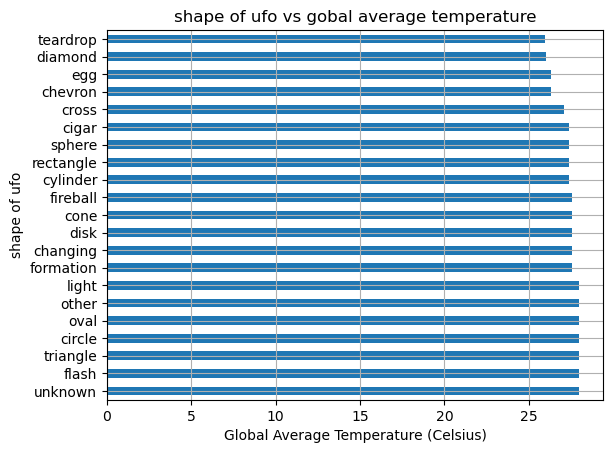

In [498]:
byshape.sort_values(ascending=False).plot.barh()

plt.xlabel("Global Average Temperature (Celsius)")
plt.ylabel("shape of ufo")
plt.title(f"shape of ufo vs gobal average temperature")
plt.grid()

# # Save the figure
plt.savefig("output_data/compare.png")

# # Show plot
plt.show()

In [538]:
bylatlon = m.groupby(['latitude','longitude ', 'city'])['avgtemp'].max().dropna()

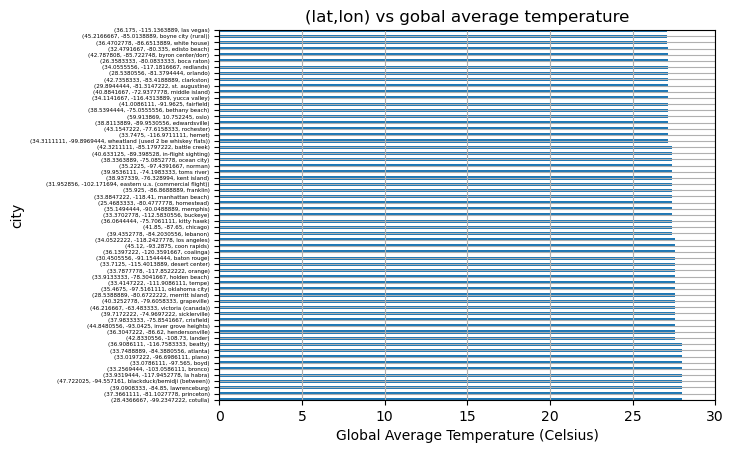

In [540]:
bylatlon.sort_values(ascending=False).plot.barh(layout='constrained')
plt.yticks(fontsize=4)

plt.xlim(0, 30)
plt.ylim(0, 60)

plt.xlabel("Global Average Temperature (Celsius)")
plt.ylabel("city")
plt.title(f"(lat,lon) vs gobal average temperature")
plt.grid()

# # Save the figure
plt.savefig("output_data/latlong_vs_temperature.png")

# # Show plot
plt.show()

In [476]:
ufo_data.merge(weather_df, how='left')

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,Date,Time,date,year,mintemp,maxtemp,avgtemp,totalsnow,sunhour
0,10/10/1949 20:30,san marcos,tx,us,cylinder,2700,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,1949-10-10,2000,1949-10-10,1949,NaN,NaN,NaN,NaN,NaN
1,10/10/1949 21:00,lackland afb,tx,NaN,light,7200,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,1949-10-10,2100,1949-10-10,1949,NaN,NaN,NaN,NaN,NaN
2,10/10/1955 17:00,chester (uk/england),NaN,gb,circle,20,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,1955-10-10,1700,1955-10-10,1955,NaN,NaN,NaN,NaN,NaN
3,10/10/1956 21:00,edna,tx,us,circle,20,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,1956-10-10,2100,1956-10-10,1956,NaN,NaN,NaN,NaN,NaN
4,10/10/1960 20:00,kaneohe,hi,us,light,900,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,1960-10-10,2000,1960-10-10,1960,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80326,9/9/2013 21:15,nashville,tn,us,light,600.0,10 minutes,Round from the distance/slowly changing colors...,9/30/2013,36.165833,-86.784444,2013-09-09,2100,2013-09-09,2013,9.0,35.0,22.105263,0.0,11.073684
80327,9/9/2013 22:00,boise,id,us,circle,1200.0,20 minutes,Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...,9/30/2013,43.613611,-116.202500,2013-09-09,2200,2013-09-09,2013,9.0,35.0,22.105263,0.0,11.073684
80328,9/9/2013 22:00,napa,ca,us,other,1200.0,hour,Napa UFO&#44,9/30/2013,38.297222,-122.284444,2013-09-09,2200,2013-09-09,2013,9.0,35.0,22.105263,0.0,11.073684
80329,9/9/2013 22:20,vienna,va,us,circle,5.0,5 seconds,Saw a five gold lit cicular craft moving fastl...,9/30/2013,38.901111,-77.265556,2013-09-09,2200,2013-09-09,2013,9.0,35.0,22.105263,0.0,11.073684


In [208]:
#filtering rows by narrowing down the year range of ufo_data
# ufo_weather = pd.merge(ufo_data, ufo_df_clear, how='outer', indicator=True).query('_merge != "left_only"').drop(columns=['_merge'])

In [351]:
# Export the ufo_weather into a csv
ufo_weather.to_csv("detailed_ufo_weather.csv")

In [462]:
#each day has different values on same day, using mean value to summarize it
# .mean()[['mintemp','maxtemp','avgtemp','totalsnow','sunhour']]
ufo_weather_latlon = ufo_weather.groupby(['datetime', 'city', 'state', 'country','latitude', 'longitude ']).agg({'mintemp':'min','maxtemp':'max', 'avgtemp':'mean', 'totalsnow':'sum', 'sunhour':'mean'})

In [463]:
#groupby date
ufo_weather_latlon.reset_index(inplace=True)

In [464]:
# ufo_weather_latlon = pd.DataFrame(ufo_weather_latlon)
ufo_weather_latlon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26535 entries, 0 to 26534
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    26535 non-null  object 
 1   city        26535 non-null  object 
 2   state       26535 non-null  object 
 3   country     26535 non-null  object 
 4   latitude    26535 non-null  float64
 5   longitude   26535 non-null  float64
 6   mintemp     26535 non-null  float64
 7   maxtemp     26535 non-null  float64
 8   avgtemp     26535 non-null  float64
 9   totalsnow   26535 non-null  float64
 10  sunhour     26535 non-null  float64
dtypes: float64(7), object(4)
memory usage: 2.2+ MB


In [450]:
ufo_weather_latlon.merge(

,datetime,city,state,country,latitude,longitude,mintemp,maxtemp,avgtemp,totalsnow,sunhour
26534,9/9/2013 23:00,edmond,ok,us,35.652778,-97.477778,16.947368,28.052632,22.105263,0.000000,11.073684
26533,9/9/2013 22:20,vienna,va,us,38.901111,-77.265556,16.947368,28.052632,22.105263,0.000000,11.073684
26532,9/9/2013 22:00,napa,ca,us,38.297222,-122.284444,16.947368,28.052632,22.105263,0.000000,11.073684
26531,9/9/2013 22:00,boise,id,us,43.613611,-116.202500,16.947368,28.052632,22.105263,0.000000,11.073684
26530,9/9/2013 21:15,nashville,tn,us,36.165833,-86.784444,16.947368,28.052632,22.105263,0.000000,11.073684
...,...,...,...,...,...,...,...,...,...,...,...
4,1/1/2009 00:10,tyler,tx,us,32.351111,-95.300833,1.200000,9.057143,4.857143,0.011429,7.660000
3,1/1/2009 00:05,canoga park,ca,us,34.201111,-118.597222,1.200000,9.057143,4.857143,0.011429,7.660000
2,1/1/2009 00:01,spring valley,ca,us,32.744722,-116.998056,1.200000,9.057143,4.857143,0.011429,7.660000
1,1/1/2009 00:00,weeki wachee,fl,us,28.515278,-82.573056,1.200000,9.057143,4.857143,0.011429,7.660000


In [385]:
# Export the ufo_weather into a csv
ufo_weather_latlon.to_csv("clear_ufoweather.csv", index_label = "index")

## Visualization Part
### Testing (commend out) + Real work

In [413]:
#make the sample to test the visual effects
# ufo_weather_sample = ufo_weather_latlon.sample(n=100)

In [414]:
# ufo_weather_sample

In [416]:
#datetime type convertions
# ufo_weather_latlon['datetime'] = ufo_weather_latlon['datetime'].astype('datetime64[ns]')

In [412]:
# # Export the sample into a csv
# ufo_weather_sample.to_csv("ufo_weather_sample.csv", index_label = "index")

In [421]:
#find the start date and end date
#sort values
ufo_weather_latlon = ufo_weather_latlon.sort_values('datetime', ascending=False)
print(ufo_weather_latlon['datetime'].max())
print(ufo_weather_latlon['datetime'].min())

9/9/2013 23:00
1/1/2009 00:00


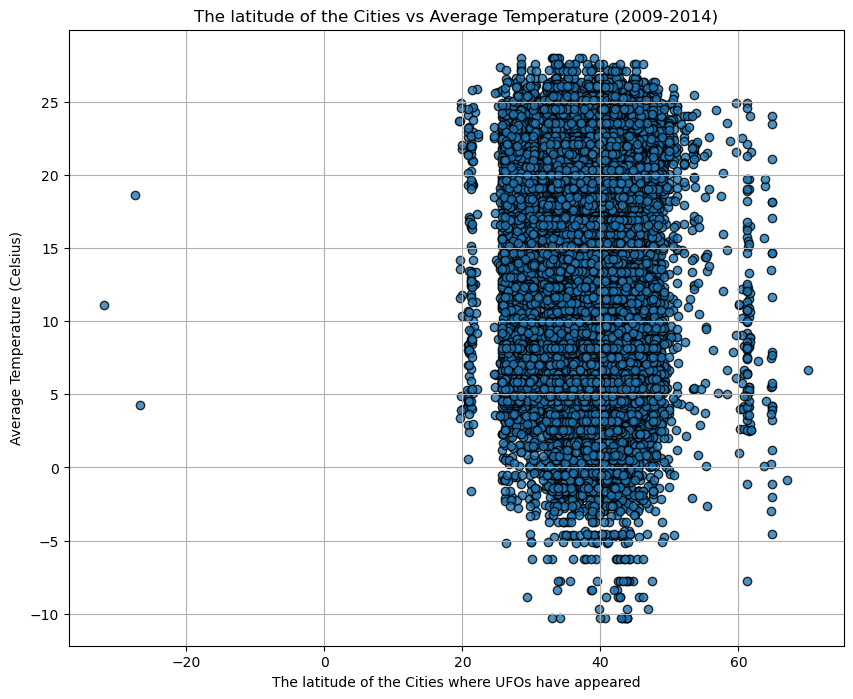

In [422]:
# Build scatter plot for city latitude vs. temperature
city_lat_plot = ufo_weather_latlon['latitude']
temp_plot = ufo_weather_latlon['avgtemp']

# Incorporate the other graph properties
fig1, ax1 = plt.subplots(figsize=(10,8))
markersize=12
plt.scatter(city_lat_plot,temp_plot, edgecolor="black", linewidth=1, marker="o", alpha=0.8)
plt.xlabel("The latitude of the Cities where UFOs have appeared")
plt.ylabel("Average Temperature (Celsius)")
plt.title(f"The latitude of the Cities vs Average Temperature (2009-2014)")
plt.grid()

# # Save the figure
plt.savefig("output_data/Sample_1.png")

# # Show plot
plt.show()

In [392]:
#Define a function to create Linear Regression plots
def plot_linear_regression(x_values, y_values, x_label, y_label, hemisphere, text_coordinates, ylim=None):
    (slope, intercept, r, p, stderr) = linregress(x_values, y_values)
    regress_values = slope * x_values + intercept
    line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2)) 

    fig1, ax1 = plt.subplots(figsize=(12,8))
    plt.scatter(x_values, y_values, edgecolor="black", linewidth=1, marker="o", alpha=0.8)
    plt.plot(x_values,regress_values,"r-")
    plt.title(f"{hemisphere} Hemisphere - {x_label} vs {y_label} (2019-2014)",fontsize = 15)
    plt.xlabel(x_label,fontsize=14)
    plt.ylabel(y_label,fontsize=14)
    if ylim is not None:
        plt.ylim(0, ylim)
    plt.annotate(line_eq, text_coordinates, fontsize=20, color="red")
    
    print(f"The r-squared is: {r**2}")
    correlation = st.pearsonr(x_values,y_values)
    print(f"The correlation between both factors is {round(correlation[0],2)}")

In [424]:
# Create a DataFrame with the Northern Hemisphere data (Latitude >= 0)
northern_hemi_df = ufo_weather_latlon.loc[ufo_weather_latlon["latitude"] >= 0]

# Display sample data
northern_hemi_df.head()

,datetime,city,state,country,latitude,longitude,mintemp,maxtemp,avgtemp,totalsnow,sunhour
26534,9/9/2013 23:00,edmond,ok,us,35.652778,-97.477778,16.947368,28.052632,22.105263,0.0,11.073684
26533,9/9/2013 22:20,vienna,va,us,38.901111,-77.265556,16.947368,28.052632,22.105263,0.0,11.073684
26532,9/9/2013 22:00,napa,ca,us,38.297222,-122.284444,16.947368,28.052632,22.105263,0.0,11.073684
26531,9/9/2013 22:00,boise,id,us,43.613611,-116.202500,16.947368,28.052632,22.105263,0.0,11.073684
26530,9/9/2013 21:15,nashville,tn,us,36.165833,-86.784444,16.947368,28.052632,22.105263,0.0,11.073684


In [425]:
# Create a DataFrame with the Southern Hemisphere data (Latitude < 0)
southern_hemi_df = ufo_weather_latlon.loc[ufo_weather_latlon["latitude"] < 0]

# Display sample data
southern_hemi_df.head()

,datetime,city,state,country,latitude,longitude,mintemp,maxtemp,avgtemp,totalsnow,sunhour
10806,3/16/2014 01:00,perth (western australia),wa,au,-31.95224,115.861397,6.000000,16.300000,11.100000,0.0,8.520000
7686,12/25/2010 21:45,maroochydore (queensland) (australia),dc,au,-26.66008,153.099533,1.909091,6.636364,4.272727,0.0,7.481818
3868,10/3/2013 22:00,cue (western australia) (australia),wa,au,-27.42395,117.897392,13.850000,24.600000,18.600000,0.0,10.675000


The r-squared is: 0.0033985661165794427
The correlation between both factors is 0.06


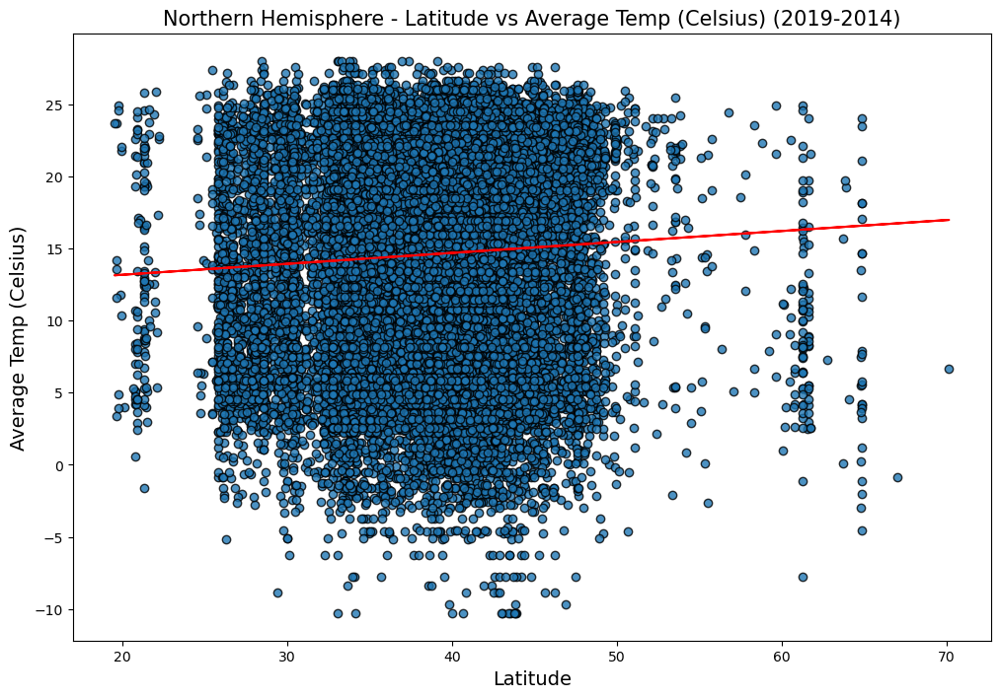

In [426]:
# Linear regression on Northern Hemisphere
x_values = northern_hemi_df["latitude"]
y_values = northern_hemi_df["avgtemp"]
plot_linear_regression(x_values, y_values, "Latitude", "Average Temp (Celsius)", "Northern", (10, 10))

plt.savefig("./output_data/northern_hem_linear_lat_vs_temp.png", bbox_inches="tight")
plt.show()

In [399]:
sun_hours = ufo_weather_sample["sunhour"] 

In [403]:
sun_hours.max()

14.421428571428573

In [566]:
#sun hour bar chart

count_timepoints_pandas = sun_hours.sort_values(ascending=False).plot.bar(color='b')
plt.xlabel("sun hours in each location where UFO appeared")
plt.ylabel("sun hours")
plt.xticks(fontsize=3, rotation=90)
plt.show()